In [ ]:
pip install openai==0.28

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.5/76.5 kB 1.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
llmx 0.0.15a0 requires cohere, which is not installed.
llmx 0.0.15a0 requires tiktoken, which is not installed.


In [ ]:
## imports
from typing import List, Tuple  # for type hints

import numpy as np  # for manipulating arrays
import pandas as pd  # for manipulating data in dataframes
import pickle  # for saving the embeddings cache
import plotly.express as px  # for plots
import random  # for generating run IDs
from sklearn.model_selection import train_test_split  # for splitting train & test data
import torch  # for matrix optimization
from openai.embeddings_utils import get_embedding, cosine_similarity  # for embeddings

In [71]:
# calculate accuracy (and its standard error) of predicting label=1 if similarity>x
# x is optimized by sweeping from -1 to 1 in steps of 0.01
def accuracy_and_se(cosine_similarity: float, labeled_similarity: int) -> Tuple[float]:
    accuracies = []
    for threshold_thousandths in range(-1000, 1000, 1):
        threshold = threshold_thousandths / 1000
        total = 0
        correct = 0
        for cs, ls in zip(cosine_similarity, labeled_similarity):
            total += 1
            if cs > threshold:
                prediction = 1
            else:
                prediction = -1
            if prediction == ls:
                correct += 1
        accuracy = correct / total
        accuracies.append(accuracy)
    a = max(accuracies)
    n = len(cosine_similarity)
    standard_error = (a * (1 - a) / n) ** 0.5  # standard error of binomial
    return a, standard_error

In [ ]:
df2 = pd.read_csv('annotation4_after2word.csv')

In [ ]:
df = df2


In [ ]:
df

,content,sentiment,Sector,Industry,max_cosine_similarities,ESG_or_not,SASB,SASB_embedding,dataset,embedding,cosine_similarities,max_embedding,max_embedding_word
0,More millennials are turning 40 ‚Äî and they'r...,"{'positive': 0.06741135, 'negative': 0.1715823...",Services,Hotels & Lodging,0.785040,-1,{'Water Management': 'Hotel buildings require ...,"{'Water Management': [0.013346040463976059, -0...",train,"[0.0034837801940739155, -0.018379943445324898,...","{'Water Management': 0.7505384757725996, 'Clim...","[0.008788215686639065, -0.005378414729180266, ...",The Hotels & Lodging industry is highly relian...
1,"FedEx Parks Planes, Maersk Cancels Sails: Worl...","{'positive': 0.0276921, 'negative': 0.91408736...",Transportation,Air Freight & Logistics,0.806254,-1,{'Greenhouse Gas Emissions': 'Air Freight & Lo...,{'Greenhouse Gas Emissions': [0.00950879266272...,train,"[-0.016028370708227158, -0.038418304175138474,...",{'Greenhouse Gas Emissions': 0.794454891784717...,"[-0.002340704698821943, -0.040607881330244414,...",Employees in the Air Freight & Logistics indus...
2,You could be buying shoplifted stuff on Amazon...,"{'positive': 0.034610316, 'negative': 0.476638...",Consumer Goods,Multiline and Specialty Retailers & Distributors,0.803166,1,{'Workforce Diversity & Inclusion': 'The Multi...,{'Workforce Diversity & Inclusion': [-0.022194...,train,"[0.006538767833262682, -0.0335729718208313, -0...",{'Workforce Diversity & Inclusion': 0.76499455...,"[-0.006217272626085497, -0.0009317641472651714...",Consumers trust retail entities with their fin...
3,Marketers: Turn Impressions Into Intent This H...,"{'positive': 0.09345539, 'negative': 0.0399913...",Consumer Goods,E-Commerce,0.802793,-1,{'Product Packaging & Distribution': 'A signif...,{'Product Packaging & Distribution': [0.017690...,train,"[-0.012135321274399757, -0.015672283247113228,...",{'Product Packaging & Distribution': 0.7775707...,"[0.009207524693889902, -0.012759092727629052, ...",The business model of entities in the E-Commer...
4,Royal Caribbean Inks Sustainable Shipbuilding ...,"{'positive': 0.30869853, 'negative': 0.0087451...",Transportation,Cruise Lines,0.792948,1,{'Customer Health & Safety': 'Cruise lines off...,{'Customer Health & Safety': [0.02446571152799...,train,"[0.00059090880677104, -0.040115032345056534, 0...",{'Customer Health & Safety': 0.787090176529222...,"[0.0242732587449533, -0.027872304145332892, 0....",Cruise entities operate a uniquely transitory ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
550,Waste Management (WM) Stock Moves -0.91%: What...,"{'positive': 0.6840206, 'negative': 0.23210213...",Infrastructure,Waste Management,0.805994,-1,{'Greenhouse Gas Emissions': 'Landfills are a ...,{'Greenhouse Gas Emissions': [-0.0001698792302...,test,"[-0.005872064735740423, -0.031545888632535934,...",{'Greenhouse Gas Emissions': 0.743747592175264...,"[-0.0011502468158345717, -0.032458606820530075...",Organised labour plays an important role in th...
551,Newmont Corporation (NEM) Stock Moves -0.58%: ...,"{'positive': 0.07588659, 'negative': 0.8466317...",Extractives & Minerals Processing,Metals & Mining,0.756432,-1,{'Tailings Storage Facilities Management': 'Th...,{'Tailings Storage Facilities Management': [0....,test,"[-0.013726205565035343, -0.023092789575457573,...",{'Tailings Storage Facilities Management': 0.7...,"[-0.00513920216254887, -0.02769421873927176, 0...",Metals and mining entities face inherent tensi...
552,"CFOs Boost Currency Protections, Extend Hedge ...","{'positive': 0.031100325, 'negative': 0.955758...",Food & Beverage,Non-Alcoholic Beverages,0.776955,-1,{'Water Management': 'Water management relates...,"{'Water Management': [0.007515041336335117, -0...",test,"[-0.008213700726628304, -0.018072837963700294,...","{'Water Management': 0.7251327993457838, 'Prod...","[0.016293765295825713, -0.047365905599416926, ...",Entities in the Non-Alcoholic Beverages indust...
553,"5,000 GM Employees Reportedly Take Buyouts In ...","

In [ ]:
def embedding_multiplied_by_matrix(
    embedding: List[float], matrix: torch.tensor
) -> np.array:
    embedding_tensor = torch.tensor(embedding).float()
    modified_embedding = embedding_tensor @ matrix
    modified_embedding = modified_embedding.detach().numpy()
    return modified_embedding


# compute custom embeddings and new cosine similarities
def apply_matrix_to_embeddings_dataframe(matrix: torch.tensor, df: pd.DataFrame):
    for column in ["embedding", "max_embedding"]:
        df[f"{column}_custom"] = df[column].apply(
            lambda x: embedding_multiplied_by_matrix(x, matrix)
        )
    df["cosine_similarity_custom"] = df.apply(
        lambda row: cosine_similarity(
            row["embedding_custom"], row["max_embedding_custom"]
        ),
        axis=1,
    )


In [ ]:
def optimize_matrix(
    modified_embedding_length: int = 2048,  # in my brief experimentation, bigger was better (2048 is length of babbage encoding)
    batch_size: int = 100,
    max_epochs: int = 100,
    learning_rate: float = 100.0,  # seemed to work best when similar to batch size - feel free to try a range of values
    dropout_fraction: float = 0.0,  # in my testing, dropout helped by a couple percentage points (definitely not necessary)
    df: pd.DataFrame = df,
    print_progress: bool = True,
    save_results: bool = True,
) -> torch.tensor:
    """Return matrix optimized to minimize loss on training data."""
    run_id = random.randint(0, 2 ** 31 - 1)  # (range is arbitrary)
    # convert from dataframe to torch tensors
    # e is for embedding, s for similarity label
    def tensors_from_dataframe(
        df: pd.DataFrame,
        embedding_column_1: str,
        embedding_column_2: str,
        similarity_label_column: str,
    ) -> Tuple[torch.tensor]:
        e1 = np.stack(np.array(df[embedding_column_1].values))
        e2 = np.stack(np.array(df[embedding_column_2].values))
        s = np.stack(np.array(df[similarity_label_column].astype("float").values))

        e1 = torch.from_numpy(e1).float()
        e2 = torch.from_numpy(e2).float()
        s = torch.from_numpy(s).float()

        return e1, e2, s

    e1_train, e2_train, s_train = tensors_from_dataframe(
        df[df["dataset"] == "train"], "embedding", "max_embedding", "ESG_or_not"
    )
    e1_test, e2_test, s_test = tensors_from_dataframe(
        df[df["dataset"] == "test"], "embedding", "max_embedding", "ESG_or_not"
    )

    # create dataset and loader
    dataset = torch.utils.data.TensorDataset(e1_train, e2_train, s_train)
    train_loader = torch.utils.data.DataLoader(
        dataset, batch_size=batch_size, shuffle=True
    )

    # define model (similarity of projected embeddings)
    def model(embedding_1, embedding_2, matrix, dropout_fraction=dropout_fraction):
        e1 = torch.nn.functional.dropout(embedding_1, p=dropout_fraction)
        e2 = torch.nn.functional.dropout(embedding_2, p=dropout_fraction)
        modified_embedding_1 = e1 @ matrix  # @ is matrix multiplication
        modified_embedding_2 = e2 @ matrix
        similarity = torch.nn.functional.cosine_similarity(
            modified_embedding_1, modified_embedding_2
        )
        return similarity

    # define loss function to minimize
    def mse_loss(predictions, targets):
        difference = predictions - targets
        return torch.sum(difference * difference) / difference.numel()

    # initialize projection matrix
    embedding_length = len(df["embedding"].values[0])
    matrix = torch.randn(
        embedding_length, modified_embedding_length, requires_grad=True
    )

    epochs, types, losses, accuracies, matrices = [], [], [], [], []
    for epoch in range(1, 1 + max_epochs):
        # iterate through training dataloader
        for a, b, actual_similarity in train_loader:
            # generate prediction
            predicted_similarity = model(a, b, matrix)
            # get loss and perform backpropagation
            loss = mse_loss(predicted_similarity, actual_similarity)
            loss.backward()
            # update the weights
            with torch.no_grad():
                matrix -= matrix.grad * learning_rate
                # set gradients to zero
                matrix.grad.zero_()
        # calculate test loss
        test_predictions = model(e1_test, e2_test, matrix)
        test_loss = mse_loss(test_predictions, s_test)

        # compute custom embeddings and new cosine similarities
        apply_matrix_to_embeddings_dataframe(matrix, df)

        # calculate test accuracy
        for dataset in ["train", "test"]:
            data = df[df["dataset"] == dataset]
            a, se = accuracy_and_se(data["max_cosine_similarities"], data["ESG_or_not"])

            # record results of each epoch
            epochs.append(epoch)
            types.append(dataset)
            losses.append(loss.item() if dataset == "train" else test_loss.item())
            accuracies.append(a)
            matrices.append(matrix.detach().numpy())

            # optionally print accuracies
            if print_progress is True:
                print(
                    f"Epoch {epoch}/{max_epochs}: {dataset} accuracy: {a:0.1%} ± {1.96 * se:0.1%}"
                )

    data = pd.DataFrame(
        {"epoch": epochs, "type": types, "loss": losses, "accuracy": accuracies}
    )
    data["run_id"] = run_id
    data["modified_embedding_length"] = modified_embedding_length
    data["batch_size"] = batch_size
    data["max_epochs"] = max_epochs
    data["learning_rate"] = learning_rate
    data["dropout_fraction"] = dropout_fraction
    data[
        "matrix"
    ] = matrices  # saving every single matrix can get big; feel free to delete/change
    if save_results is True:
        data.to_csv(f"{run_id}_optimization_results.csv", index=False)

    return data



In [ ]:
import json
import numpy as np
import pandas as pd

# 假设df是您的DataFrame，'embedding'是需要转换的列
def convert_embedding(embedding_str):
    try:
        # 将字符串解析为数值列表
        embedding_list = json.loads(embedding_str)
        return np.array(embedding_list, dtype=np.float64)
    except json.JSONDecodeError:
        return np.nan  # 或者根据需要返回适当的默认值

# 应用转换函数
df['embedding'] = df['embedding'].apply(convert_embedding)


In [ ]:
df['max_embedding'] = df['max_embedding'].apply(convert_embedding)

In [ ]:
# example hyperparameter search
# I recommend starting with max_epochs=10 while initially exploring
results = []
max_epochs = 30
dropout_fraction = 0.2
for batch_size, learning_rate in [(10, 10), (100, 100), (1000, 1000)]:
    result = optimize_matrix(
        batch_size=batch_size,
        learning_rate=learning_rate,
        max_epochs=max_epochs,
        dropout_fraction=dropout_fraction,
        save_results=False,
    )
    results.append(result)

Epoch 1/30: train accuracy: 64.3% ± 5.6%
Epoch 1/30: test accuracy: 65.5% ± 5.6%
Epoch 2/30: train accuracy: 64.3% ± 5.6%
Epoch 2/30: test accuracy: 65.5% ± 5.6%
Epoch 3/30: train accuracy: 64.3% ± 5.6%
Epoch 3/30: test accuracy: 65.5% ± 5.6%
Epoch 4/30: train accuracy: 64.3% ± 5.6%
Epoch 4/30: test accuracy: 65.5% ± 5.6%
Epoch 5/30: train accuracy: 64.3% ± 5.6%
Epoch 5/30: test accuracy: 65.5% ± 5.6%
Epoch 6/30: train accuracy: 64.3% ± 5.6%
Epoch 6/30: test accuracy: 65.5% ± 5.6%
Epoch 7/30: train accuracy: 64.3% ± 5.6%
Epoch 7/30: test accuracy: 65.5% ± 5.6%
Epoch 8/30: train accuracy: 64.3% ± 5.6%
Epoch 8/30: test accuracy: 65.5% ± 5.6%
Epoch 9/30: train accuracy: 64.3% ± 5.6%
Epoch 9/30: test accuracy: 65.5% ± 5.6%
Epoch 10/30: train accuracy: 64.3% ± 5.6%
Epoch 10/30: test accuracy: 65.5% ± 5.6%
Epoch 11/30: train accuracy: 64.3% ± 5.6%
Epoch 11/30: test accuracy: 65.5% ± 5.6%
Epoch 12/30: train accuracy: 64.3% ± 5.6%
Epoch 12/30: test accuracy: 65.5% ± 5.6%
Epoch 13/30: train acc

In [ ]:
runs_df = pd.concat(results)

# plot training loss and test loss over time
px.line(
    runs_df,
    line_group="run_id",
    x="epoch",
    y="loss",
    color="type",
    hover_data=["batch_size", "learning_rate", "dropout_fraction"],
    facet_row="learning_rate",
    facet_col="batch_size",
    width=500,
).show()

# plot accuracy over time
px.line(
    runs_df,
    line_group="run_id",
    x="epoch",
    y="accuracy",
    color="type",
    hover_data=["batch_size", "learning_rate", "dropout_fraction"],
    facet_row="learning_rate",
    facet_col="batch_size",
    width=500,
).show()

In [ ]:
# apply result of best run to original data
best_run = runs_df.sort_values(by="accuracy", ascending=False).iloc[0]
best_matrix = best_run["matrix"]
apply_matrix_to_embeddings_dataframe(best_matrix, df)

In [ ]:
# plot similarity distribution BEFORE customization
px.histogram(
    df,
    x="max_cosine_similarities",
    color="ESG_or_not",
    barmode="overlay",
    width=500,
    facet_row="dataset",
).show()

test_df = df[df["dataset"] == "test"]
a, se = accuracy_and_se(test_df["max_cosine_similarities"], test_df["ESG_or_not"])
print(f"Test accuracy: {a:0.1%} ± {1.96 * se:0.1%}")

# plot similarity distribution AFTER customization
px.histogram(
    df,
    x="cosine_similarity_custom",
    color="ESG_or_not",
    barmode="overlay",
    width=500,
    facet_row="dataset",
).show()

a, se = accuracy_and_se(test_df["cosine_similarity_custom"], test_df["ESG_or_not"])
print(f"Test accuracy after customization: {a:0.1%} ± {1.96 * se:0.1%}")

Test accuracy: 65.5% ± 5.6%


Test accuracy after customization: 68.7% ± 5.5%


In [ ]:
best_matrix

array([[-0.05459123, -0.2470747 ,  0.80980915, ..., -1.5197189 ,
        -0.381935  , -0.7936078 ],
       [ 0.9837442 , -2.2606127 , -1.0865396 , ...,  1.8525157 ,
         0.04621658, -0.8897743 ],
       [-1.2434049 ,  2.4337254 ,  1.3970144 , ..., -0.40215427,
         1.8122455 , -0.8095557 ],
       ...,
       [-0.4825117 ,  0.1497842 ,  0.03081109, ..., -0.57080984,
         1.9501824 ,  0.28118345],
       [-1.4908806 ,  0.31204915,  0.40828392, ..., -0.4137255 ,
         1.1744353 , -1.6840347 ],
       [-0.23218873, -0.68197554,  1.8814079 , ..., -0.06401006,
         1.116685  , -0.03668854]], dtype=float32)

In [ ]:
df

,content,sentiment,Sector,Industry,max_cosine_similarities,ESG_or_not,SASB,SASB_embedding,dataset,embedding,cosine_similarities,max_embedding,max_embedding_word,embedding_custom,max_embedding_custom,cosine_similarity_custom
0,More millennials are turning 40 ‚Äî and they'r...,"{'positive': 0.06741135, 'negative': 0.1715823...",Services,Hotels & Lodging,0.785040,-1,{'Water Management': 'Hotel buildings require ...,"{'Water Management': [0.013346040463976059, -0...",train,"[0.0034837801940739155, -0.018379943445324898,...","{'Water Management': 0.7505384757725996, 'Clim...","[0.008788215686639065, -0.005378414729180266, ...",The Hotels & Lodging industry is highly relian...,"[-0.67722, -0.9750456, -0.7051897, -0.04642709...","[-0.5685138, -0.2608377, 0.0339031, 0.1427441,...",-0.298795
1,"FedEx Parks Planes, Maersk Cancels Sails: Worl...","{'positive': 0.0276921, 'negative': 0.91408736...",Transportation,Air Freight & Logistics,0.806254,-1,{'Greenhouse Gas Emissions': 'Air Freight & Lo...,{'Greenhouse Gas Emissions': [0.00950879266272...,train,"[-0.016028370708227158, -0.038418304175138474,...",{'Greenhouse Gas Emissions': 0.794454891784717...,"[-0.002340704698821943, -0.040607881330244414,...",Employees in the Air Freight & Logistics indus...,"[-0.51355916, 0.3047338, 0.18054317, 0.0731926...","[-0.07242195, 0.16550554, -0.2671935, -0.41925...",-0.308292
2,You could be buying shoplifted stuff on Amazon...,"{'positive': 0.034610316, 'negative': 0.476638...",Consumer Goods,Multiline and Specialty Retailers & Distributors,0.803166,1,{'Workforce Diversity & Inclusion': 'The Multi...,{'Workforce Diversity & Inclusion': [-0.022194...,train,"[0.006538767833262682, -0.0335729718208313, -0...",{'Workforce Diversity & Inclusion': 0.76499455...,"[-0.006217272626085497, -0.0009317641472651714...",Consumers trust retail entities with their fin...,"[-0.55156195, -0.49972522, 0.44920316, -0.9903...","[-0.39433914, -1.3825508, -0.64063776, -0.2487...",0.229074
3,Marketers: Turn Impressions Into Intent This H...,"{'positive': 0.09345539, 'negative': 0.0399913...",Consumer Goods,E-Commerce,0.802793,-1,{'Product Packaging & Distribution': 'A signif...,{'Product Packaging & Distribution': [0.017690...,train,"[-0.012135321274399757, -0.015672283247113228,...",{'Product Packaging & Distribution': 0.7775707...,"[0.009207524693889902, -0.012759092727629052, ...",The business model of entities in the E-Commer...,"[-0.64470637, -0.6060606, -0.5797743, -0.06758...","[-0.26186618, -0.92670697, -0.05888734, -0.271...",-0.085770
4,Royal Caribbean Inks Sustainable Shipbuilding ...,"{'positive': 0.30869853, 'negative': 0.0087451...",Transportation,Cruise Lines,0.792948,1,{'Customer Health & Safety': 'Cruise lines off...,{'Customer Health & Safety': [0.02446571152799...,train,"[0.00059090880677104, -0.040115032345056534, 0...",{'Customer Health & Safety': 0.787090176529222...,"[0.0242732587449533, -0.027872304145332892, 0....",Cruise entities operate a uniquely transitory ...,"[0.2444141, -0.5428733, -0.19057511, 0.7866323...","[-0.043438755, 0.15481818, 0.33713436, 0.08682...",-0.067742
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
550,Waste Management (WM) Stock Moves -0.91%: What...,"{'positive': 0.6840206, 'negative': 0.23210213...",Infrastructure,Waste Management,0.805994,-1,{'Greenhouse Gas Emissions': 'Landfills are a ...,{'Greenhouse Gas Emissions': [-0.0001698792302...,test,"[-0.005872064735740423, -0.031545888632535934,...",{'Greenhouse Gas Emissions': 0.743747592175264...,"[-0.0011502468158345717, -0.032458606820530075...",Organised labour plays an important role in th...,"[0.09086742, -0.58147126, 0.3845126, 0.9863231...","[0.18024476, -0.3824777, 0.32644865, 0.0625545...",-0.273462
551,Newmont Corporation (NEM) Stock Moves -0.58%: ...,"{'positive': 0.07588659, 'negative': 0.8466317...",Extractives & Minerals Processing,Metals & Mining,0.756432,-1,{'Tailings Storage Facilities Management': 'Th...,{'Tailings Storage Facilities M

In [ ]:
## BM25

In [ ]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

nltk.download('punkt')
nltk.download('stopwords')

stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()

def preprocess(text):
    words = word_tokenize(text.lower())
    words = [stemmer.stem(word) for word in words if word.isalpha() and word not in stop_words]
    return words


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
!pip install --upgrade gensim


In [ ]:
pip install -U gensim

In [ ]:
!python -m pip install -U gensim

In [ ]:
import gensim
print(gensim.__version__)


4.3.2


In [ ]:
import numpy as np

# 对于第二列中的每个文档，找出与其最相关的文档
for i, scores in enumerate(bm25_scores):
    max_score_index = np.argmax(scores)  # 使用numpy找到得分最高的索引
    print(f"文档 {i} ('{df['max_embedding_word'].iloc[i]}') 与文档 {max_score_index} ('{df['content'].iloc[max_score_index]}') 最相关，得分：{scores[max_score_index]}")


文档 0 ('The Hotels & Lodging industry is highly reliant on labour to operate large facilities. A service-oriented workforce that is able to provide guests a pleasant stay is a key value driver for hotel entities. This, combined with labour force dynamics, can lead to low job satisfaction that can result in high turnover and potential lawsuits, which contribute to increased expenses for hotel operators. Hotels that work to prevent discriminatory practices and ensure fair wages can improve worker satisfaction and reduce turnover.') 与文档 351 ('No sign of progress in L.A. hotel strike ahead of Fourth of July holiday - Striking hotel workers, members of Unite Here Local 11, picket outside of the JW Marriott Hotel in downtown Los Angeles on Monday.

On the second day of a major strike, thousands of service workers at hotels in Los Angeles and Orange counties remained off the job Monday in the middle of the tourist-rich Fourth of July holiday period, with no sign of movement toward contract agr

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



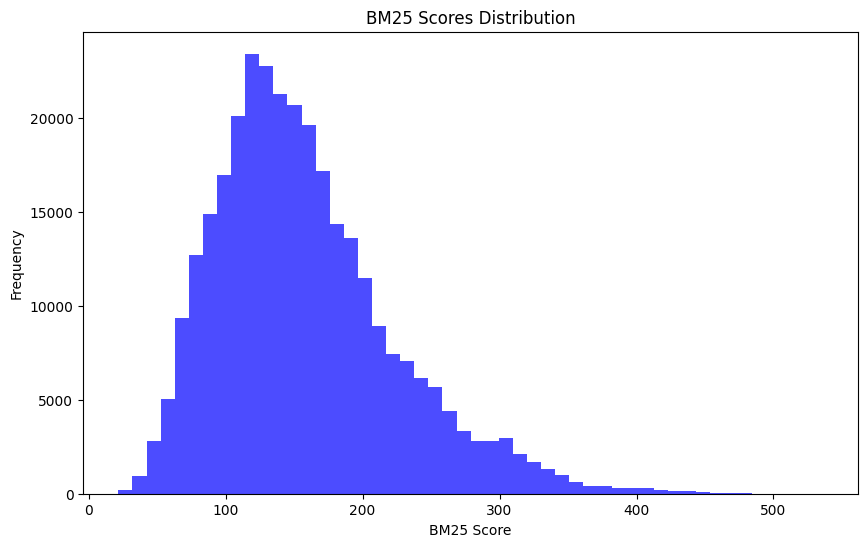

In [ ]:
import matplotlib.pyplot as plt

# 将所有得分合并到一个列表中
all_scores = [score for scores in bm25_scores for score in scores]

# 绘制直方图
plt.figure(figsize=(10, 6))
plt.hist(all_scores, bins=50, color='blue', alpha=0.7)
plt.title('BM25 Scores Distribution')
plt.xlabel('BM25 Score')
plt.ylabel('Frequency')
plt.show()


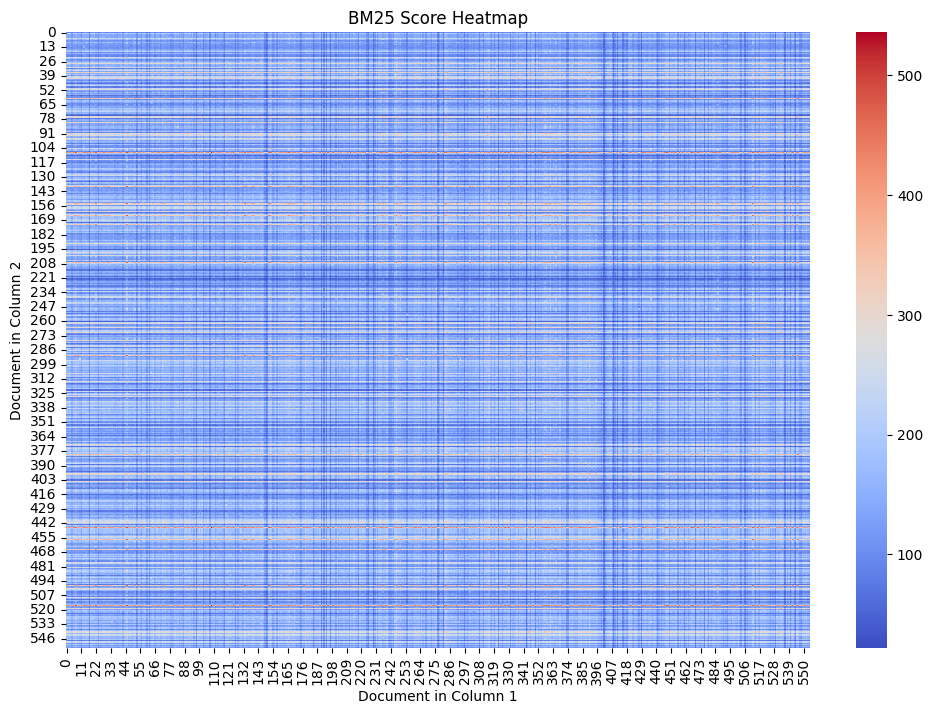

In [ ]:
import seaborn as sns

# 使用Seaborn绘制热图
plt.figure(figsize=(12, 8))
sns.heatmap(bm25_scores, annot=False, cmap='coolwarm')
plt.title('BM25 Score Heatmap')
plt.xlabel('Document in Column 1')
plt.ylabel('Document in Column 2')
plt.show()


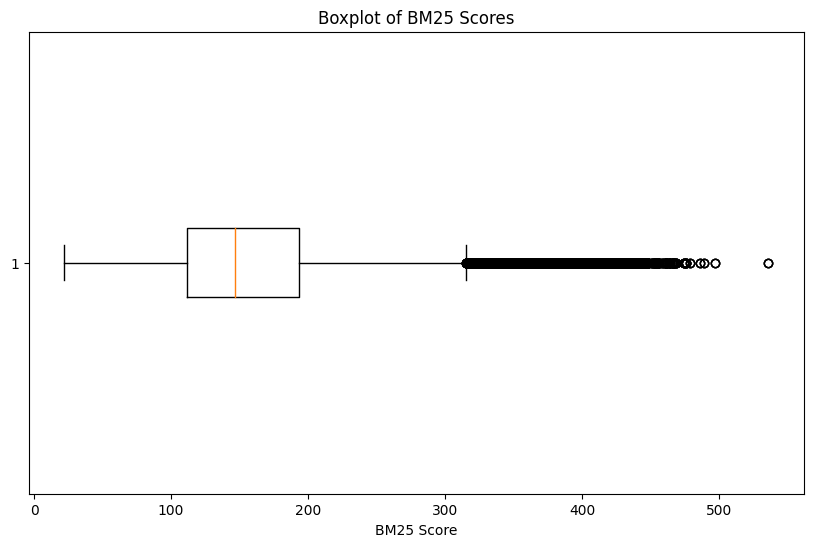

In [ ]:
plt.figure(figsize=(10, 6))
plt.boxplot(all_scores, vert=False)
plt.title('Boxplot of BM25 Scores')
plt.xlabel('BM25 Score')
plt.show()


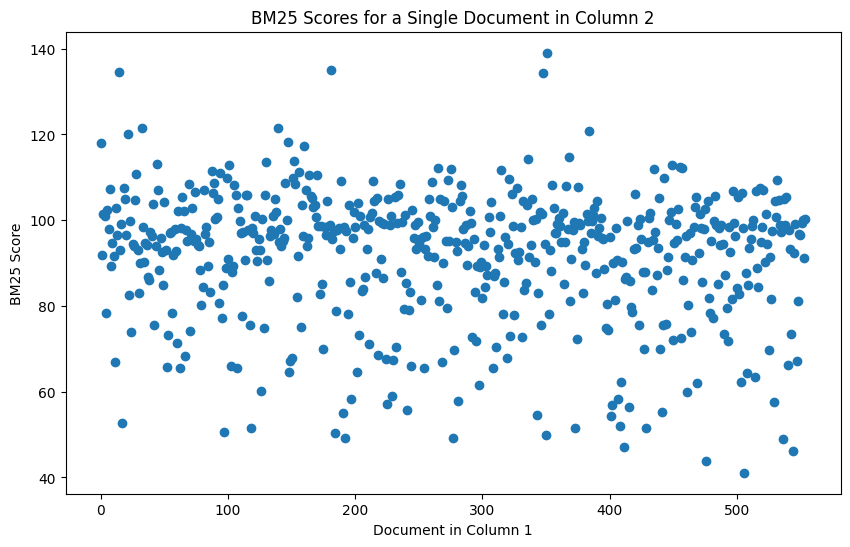

In [ ]:
# 选择第二列中的一个文档
doc_scores = bm25_scores[0]  # 例如，选择第一个文档的得分

plt.figure(figsize=(10, 6))
plt.scatter(range(len(doc_scores)), doc_scores)
plt.title('BM25 Scores for a Single Document in Column 2')
plt.xlabel('Document in Column 1')
plt.ylabel('BM25 Score')
plt.show()


In [ ]:
df

,content,sentiment,Sector,Industry,max_cosine_similarities,ESG_or_not,SASB,SASB_embedding,dataset,embedding,cosine_similarities,max_embedding,max_embedding_word,embedding_custom,max_embedding_custom,cosine_similarity_custom
0,More millennials are turning 40 ‚Äî and they'r...,"{'positive': 0.06741135, 'negative': 0.1715823...",Services,Hotels & Lodging,0.785040,-1,{'Water Management': 'Hotel buildings require ...,"{'Water Management': [0.013346040463976059, -0...",train,"[0.0034837801940739155, -0.018379943445324898,...","{'Water Management': 0.7505384757725996, 'Clim...","[0.008788215686639065, -0.005378414729180266, ...",The Hotels & Lodging industry is highly relian...,"[-0.67722, -0.9750456, -0.7051897, -0.04642709...","[-0.5685138, -0.2608377, 0.0339031, 0.1427441,...",-0.298795
1,"FedEx Parks Planes, Maersk Cancels Sails: Worl...","{'positive': 0.0276921, 'negative': 0.91408736...",Transportation,Air Freight & Logistics,0.806254,-1,{'Greenhouse Gas Emissions': 'Air Freight & Lo...,{'Greenhouse Gas Emissions': [0.00950879266272...,train,"[-0.016028370708227158, -0.038418304175138474,...",{'Greenhouse Gas Emissions': 0.794454891784717...,"[-0.002340704698821943, -0.040607881330244414,...",Employees in the Air Freight & Logistics indus...,"[-0.51355916, 0.3047338, 0.18054317, 0.0731926...","[-0.07242195, 0.16550554, -0.2671935, -0.41925...",-0.308292
2,You could be buying shoplifted stuff on Amazon...,"{'positive': 0.034610316, 'negative': 0.476638...",Consumer Goods,Multiline and Specialty Retailers & Distributors,0.803166,1,{'Workforce Diversity & Inclusion': 'The Multi...,{'Workforce Diversity & Inclusion': [-0.022194...,train,"[0.006538767833262682, -0.0335729718208313, -0...",{'Workforce Diversity & Inclusion': 0.76499455...,"[-0.006217272626085497, -0.0009317641472651714...",Consumers trust retail entities with their fin...,"[-0.55156195, -0.49972522, 0.44920316, -0.9903...","[-0.39433914, -1.3825508, -0.64063776, -0.2487...",0.229074
3,Marketers: Turn Impressions Into Intent This H...,"{'positive': 0.09345539, 'negative': 0.0399913...",Consumer Goods,E-Commerce,0.802793,-1,{'Product Packaging & Distribution': 'A signif...,{'Product Packaging & Distribution': [0.017690...,train,"[-0.012135321274399757, -0.015672283247113228,...",{'Product Packaging & Distribution': 0.7775707...,"[0.009207524693889902, -0.012759092727629052, ...",The business model of entities in the E-Commer...,"[-0.64470637, -0.6060606, -0.5797743, -0.06758...","[-0.26186618, -0.92670697, -0.05888734, -0.271...",-0.085770
4,Royal Caribbean Inks Sustainable Shipbuilding ...,"{'positive': 0.30869853, 'negative': 0.0087451...",Transportation,Cruise Lines,0.792948,1,{'Customer Health & Safety': 'Cruise lines off...,{'Customer Health & Safety': [0.02446571152799...,train,"[0.00059090880677104, -0.040115032345056534, 0...",{'Customer Health & Safety': 0.787090176529222...,"[0.0242732587449533, -0.027872304145332892, 0....",Cruise entities operate a uniquely transitory ...,"[0.2444141, -0.5428733, -0.19057511, 0.7866323...","[-0.043438755, 0.15481818, 0.33713436, 0.08682...",-0.067742
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
550,Waste Management (WM) Stock Moves -0.91%: What...,"{'positive': 0.6840206, 'negative': 0.23210213...",Infrastructure,Waste Management,0.805994,-1,{'Greenhouse Gas Emissions': 'Landfills are a ...,{'Greenhouse Gas Emissions': [-0.0001698792302...,test,"[-0.005872064735740423, -0.031545888632535934,...",{'Greenhouse Gas Emissions': 0.743747592175264...,"[-0.0011502468158345717, -0.032458606820530075...",Organised labour plays an important role in th...,"[0.09086742, -0.58147126, 0.3845126, 0.9863231...","[0.18024476, -0.3824777, 0.32644865, 0.0625545...",-0.273462
551,Newmont Corporation (NEM) Stock Moves -0.58%: ...,"{'positive': 0.07588659, 'negative': 0.8466317...",Extractives & Minerals Processing,Metals & Mining,0.756432,-1,{'Tailings Storage Facilities Management': 'Th...,{'Tailings Storage Facilities M

In [ ]:
import numpy as np

# 为最相关文档的索引和得分创建两个空列表
max_score_indices = []
max_scores = []

for scores in bm25_scores:
    # 找到最高得分及其索引
    max_score_index = np.argmax(scores)
    max_score = scores[max_score_index]

    # 将它们添加到列表中
    max_score_indices.append(max_score_index)
    max_scores.append(max_score)


In [61]:
# 创建两个新列
df['max_score_index'] = max_score_indices
df['max_score'] = max_scores

# 如果您想在DataFrame中显示相关的文档内容
df['related_content'] = df['content'].iloc[max_score_indices].values


In [62]:
df

,content,sentiment,Sector,Industry,max_cosine_similarities,ESG_or_not,SASB,SASB_embedding,dataset,embedding,cosine_similarities,max_embedding,max_embedding_word,embedding_custom,max_embedding_custom,cosine_similarity_custom,max_score_index,max_score,related_content
0,More millennials are turning 40 ‚Äî and they'r...,"{'positive': 0.06741135, 'negative': 0.1715823...",Services,Hotels & Lodging,0.785040,-1,{'Water Management': 'Hotel buildings require ...,"{'Water Management': [0.013346040463976059, -0...",train,"[0.0034837801940739155, -0.018379943445324898,...","{'Water Management': 0.7505384757725996, 'Clim...","[0.008788215686639065, -0.005378414729180266, ...",The Hotels & Lodging industry is highly relian...,"[-0.67722, -0.9750456, -0.7051897, -0.04642709...","[-0.5685138, -0.2608377, 0.0339031, 0.1427441,...",-0.298795,351,139.044668,No sign of progress in L.A. hotel strike ahead...
1,"FedEx Parks Planes, Maersk Cancels Sails: Worl...","{'positive': 0.0276921, 'negative': 0.91408736...",Transportation,Air Freight & Logistics,0.806254,-1,{'Greenhouse Gas Emissions': 'Air Freight & Lo...,{'Greenhouse Gas Emissions': [0.00950879266272...,train,"[-0.016028370708227158, -0.038418304175138474,...",{'Greenhouse Gas Emissions': 0.794454891784717...,"[-0.002340704698821943, -0.040607881330244414,...",Employees in the Air Freight & Logistics indus...,"[-0.51355916, 0.3047338, 0.18054317, 0.0731926...","[-0.07242195, 0.16550554, -0.2671935, -0.41925...",-0.308292,275,266.774372,Bosses‚Äô New Task Is Figuring Out Who‚Äôs Hig...
2,You could be buying shoplifted stuff on Amazon...,"{'positive': 0.034610316, 'negative': 0.476638...",Consumer Goods,Multiline and Specialty Retailers & Distributors,0.803166,1,{'Workforce Diversity & Inclusion': 'The Multi...,{'Workforce Diversity & Inclusion': [-0.022194...,train,"[0.006538767833262682, -0.0335729718208313, -0...",{'Workforce Diversity & Inclusion': 0.76499455...,"[-0.006217272626085497, -0.0009317641472651714...",Consumers trust retail entities with their fin...,"[-0.55156195, -0.49972522, 0.44920316, -0.9903...","[-0.39433914, -1.3825508, -0.64063776, -0.2487...",0.229074,35,213.899413,Amazon One Is One-Click For Retail - After a c...
3,Marketers: Turn Impressions Into Intent This H...,"{'positive': 0.09345539, 'negative': 0.0399913...",Consumer Goods,E-Commerce,0.802793,-1,{'Product Packaging & Distribution': 'A signif...,{'Product Packaging & Distribution': [0.017690...,train,"[-0.012135321274399757, -0.015672283247113228,...",{'Product Packaging & Distribution': 0.7775707...,"[0.009207524693889902, -0.012759092727629052, ...",The business model of entities in the E-Commer...,"[-0.64470637, -0.6060606, -0.5797743, -0.06758...","[-0.26186618, -0.92670697, -0.05888734, -0.271...",-0.085770,94,171.963821,When it comes to building trust with consumers...
4,Royal Caribbean Inks Sustainable Shipbuilding ...,"{'positive': 0.30869853, 'negative': 0.0087451...",Transportation,Cruise Lines,0.792948,1,{'Customer Health & Safety': 'Cruise lines off...,{'Customer Health & Safety': [0.02446571152799...,train,"[0.00059090880677104, -0.040115032345056534, 0...",{'Customer Health & Safety': 0.787090176529222...,"[0.0242732587449533, -0.027872304145332892, 0....",Cruise entities operate a uniquely transitory ...,"[0.2444141, -0.5428733, -0.19057511, 0.7866323...","[-0.043438755, 0.15481818, 0.33713436, 0.08682...",-0.067742,152,199.607211,Asset Managers Prompt Renewed Focus On Directo...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
550,Waste Management (WM) Stock Moves -0.91%: What...,"{'positive': 0.6840206, 'negative': 0.23210213...",Infrastructure,Waste Management,0.805994,-1,{'Greenhouse Gas Emissions': 'Landfills are a ...,{'Greenhouse Gas Emissions': [-0.0001698792302...,test,"[-0.005872064735740423, -0.031545888632535934,...",{'Greenhouse Gas Emissions': 0.743747592175264...,"[-0.0011502468158345717, -0.032458606820530075...",Organised labour plays an important 

In [ ]:
bm25_scores

[array([118.09910275,  91.93552009, 101.3523087 , 100.98919119,
         78.3143636 , 102.39430357,  97.91937   , 107.26399479,
         89.31078972,  94.68524708,  91.5273922 ,  66.84159659,
        102.75612791,  96.62235136, 134.61374692,  93.05260954,
         99.16870086,  52.81501686, 107.53288746, 104.86543585,
         96.53766101, 120.14335754,  82.61842694,  99.70039709,
         73.98209775,  94.32856871,  94.05091438, 104.70553541,
        110.80403436,  93.00191209,  82.91157735,  89.9930077 ,
        121.3934015 ,  98.29217643,  90.19726864,  94.69676416,
         94.22225698,  86.81696506,  85.98607913,  97.35558223,
         96.42044293, 103.76942992,  75.53308585,  93.86991818,
        113.14355942, 107.13247531,  88.32212064,  95.76028175,
         92.65201333,  84.92579198, 104.34106599,  93.15255537,
         65.74791316,  73.20808508,  96.91487752,  97.22361472,
         78.40289747,  91.85313676,  97.9579402 ,  92.77703256,
         71.31079344, 102.23400928,  65.

In [63]:
!pip install plotly


In [64]:
import plotly.express as px

# plot similarity distribution based on BM25 score
px.histogram(
    df,
    x="max_score",  # 假设max_score是您的BM25得分列
    color="ESG_or_not",  # 按ESG_or_not分类
    barmode="overlay",
    width=500,
    facet_row="dataset",  # 分面显示
).show()


In [65]:
def accuracy_and_se(scores, labels):
    # 这里应该是您的准确率计算逻辑
    # ...

test_df = df[df["dataset"] == "test"]
a, se = accuracy_and_se(test_df["max_score"], test_df["ESG_or_not"])
print(f"Test accuracy: {a:0.1%} ± {1.96 * se:0.1%}")


IndentationError: ignored

In [66]:
# 定义一个简单的准确率计算函数
def accuracy_and_se(scores, labels):
    # 这里是一个简化的准确率计算示例
    # 您需要根据自己的情况来编写具体的计算逻辑
    correct_predictions = (scores > 0.5) == labels  # 假设阈值为 0.5
    accuracy = correct_predictions.mean()
    se = correct_predictions.std() / len(scores) ** 0.5
    return accuracy, se

# 使用测试数据集计算准确率和标准误
test_df = df[df["dataset"] == "test"]
a, se = accuracy_and_se(test_df["max_score"], test_df["ESG_or_not"])
print(f"Test accuracy: {a:0.1%} ± {1.96 * se:0.1%}")

Test accuracy: 40.6% ± 5.8%


In [67]:
from rank_bm25 import BM25Okapi
from nltk.tokenize import word_tokenize

def preprocess(text):
    # 简单的分词和转换为小写
    return word_tokenize(text.lower())

def calculate_bm25_score(query, document):
    # 预处理文本
    query_words = preprocess(query)
    document_words = [preprocess(document)]

    # BM25 计算
    bm25 = BM25Okapi(document_words)
    score = bm25.get_scores(query_words)[0]
    return score

# 计算每一行的 BM25 得分
df['bm25_score'] = df.apply(lambda row: calculate_bm25_score(row['max_embedding_word'], row['content']), axis=1)


In [68]:
df

,content,sentiment,Sector,Industry,max_cosine_similarities,ESG_or_not,SASB,SASB_embedding,dataset,embedding,cosine_similarities,max_embedding,max_embedding_word,embedding_custom,max_embedding_custom,cosine_similarity_custom,max_score_index,max_score,related_content,bm25_score
0,More millennials are turning 40 ‚Äî and they'r...,"{'positive': 0.06741135, 'negative': 0.1715823...",Services,Hotels & Lodging,0.785040,-1,{'Water Management': 'Hotel buildings require ...,"{'Water Management': [0.013346040463976059, -0...",train,"[0.0034837801940739155, -0.018379943445324898,...","{'Water Management': 0.7505384757725996, 'Clim...","[0.008788215686639065, -0.005378414729180266, ...",The Hotels & Lodging industry is highly relian...,"[-0.67722, -0.9750456, -0.7051897, -0.04642709...","[-0.5685138, -0.2608377, 0.0339031, 0.1427441,...",-0.298795,351,139.044668,No sign of progress in L.A. hotel strike ahead...,-23.423563
1,"FedEx Parks Planes, Maersk Cancels Sails: Worl...","{'positive': 0.0276921, 'negative': 0.91408736...",Transportation,Air Freight & Logistics,0.806254,-1,{'Greenhouse Gas Emissions': 'Air Freight & Lo...,{'Greenhouse Gas Emissions': [0.00950879266272...,train,"[-0.016028370708227158, -0.038418304175138474,...",{'Greenhouse Gas Emissions': 0.794454891784717...,"[-0.002340704698821943, -0.040607881330244414,...",Employees in the Air Freight & Logistics indus...,"[-0.51355916, 0.3047338, 0.18054317, 0.0731926...","[-0.07242195, 0.16550554, -0.2671935, -0.41925...",-0.308292,275,266.774372,Bosses‚Äô New Task Is Figuring Out Who‚Äôs Hig...,-42.131833
2,You could be buying shoplifted stuff on Amazon...,"{'positive': 0.034610316, 'negative': 0.476638...",Consumer Goods,Multiline and Specialty Retailers & Distributors,0.803166,1,{'Workforce Diversity & Inclusion': 'The Multi...,{'Workforce Diversity & Inclusion': [-0.022194...,train,"[0.006538767833262682, -0.0335729718208313, -0...",{'Workforce Diversity & Inclusion': 0.76499455...,"[-0.006217272626085497, -0.0009317641472651714...",Consumers trust retail entities with their fin...,"[-0.55156195, -0.49972522, 0.44920316, -0.9903...","[-0.39433914, -1.3825508, -0.64063776, -0.2487...",0.229074,35,213.899413,Amazon One Is One-Click For Retail - After a c...,-38.780256
3,Marketers: Turn Impressions Into Intent This H...,"{'positive': 0.09345539, 'negative': 0.0399913...",Consumer Goods,E-Commerce,0.802793,-1,{'Product Packaging & Distribution': 'A signif...,{'Product Packaging & Distribution': [0.017690...,train,"[-0.012135321274399757, -0.015672283247113228,...",{'Product Packaging & Distribution': 0.7775707...,"[0.009207524693889902, -0.012759092727629052, ...",The business model of entities in the E-Commer...,"[-0.64470637, -0.6060606, -0.5797743, -0.06758...","[-0.26186618, -0.92670697, -0.05888734, -0.271...",-0.085770,94,171.963821,When it comes to building trust with consumers...,-30.990759
4,Royal Caribbean Inks Sustainable Shipbuilding ...,"{'positive': 0.30869853, 'negative': 0.0087451...",Transportation,Cruise Lines,0.792948,1,{'Customer Health & Safety': 'Cruise lines off...,{'Customer Health & Safety': [0.02446571152799...,train,"[0.00059090880677104, -0.040115032345056534, 0...",{'Customer Health & Safety': 0.787090176529222...,"[0.0242732587449533, -0.027872304145332892, 0....",Cruise entities operate a uniquely transitory ...,"[0.2444141, -0.5428733, -0.19057511, 0.7866323...","[-0.043438755, 0.15481818, 0.33713436, 0.08682...",-0.067742,152,199.607211,Asset Managers Prompt Renewed Focus On Directo...,-22.517036
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
550,Waste Management (WM) Stock Moves -0.91%: What...,"{'positive': 0.6840206, 'negative': 0.23210213...",Infrastructure,Waste Management,0.805994,-1,{'Greenhouse Gas Emissions': 'Landfills are a ...,{'Greenhouse Gas Emissions': [-0.0001698792302...,test,"[-0.005872064735740423, -0.031545888632535934,...",{'Greenhouse Gas Emissions': 0.743747592175264...,"[-0.0011502468158

In [69]:
import plotly.express as px

# plot similarity distribution based on BM25 score
px.histogram(
    df,
    x="bm25_score",  # 假设max_score是您的BM25得分列
    color="ESG_or_not",  # 按ESG_or_not分类
    barmode="overlay",
    width=500,
    facet_row="dataset",  # 分面显示
).show()

In [72]:
test_df = df[df["dataset"] == "test"]
a, se = accuracy_and_se(test_df["bm25_score"], test_df["ESG_or_not"])
print(f"Test accuracy: {a:0.1%} ± {1.96 * se:0.1%}")


Test accuracy: 59.4% ± 5.8%
